# <center style="font-family: consolas; font-size: 32px; font-weight: bold;"> Google Research - ✈️ Identify Contrails to 🔥Reduce Global Warming - Exploratory Data Analysis</center>
<p><center style="color:#949494; font-family: consolas; font-size: 20px;">Train ML models to identify contrails in satellite images and help prevent their formation</center></p>

***

# <center style="font-family: consolas; font-size: 32px; font-weight: bold;">(ಠಿ⁠_⁠ಠ) Overview</center>

<p style="font-family: consolas; font-size: 16px;">⚪ The goal of the competition is to <b>help researchers improve the accuracy of their contrail models by validating them with satellite imagery</b>.</p>

<p style="font-family: consolas; font-size: 16px;">⚪ Contrails are clouds of ice crystals that form in aircraft engine exhaust and can contribute to global warming by trapping heat in the atmosphere. Contrail avoidance is a potentially scalable, cost-effective sustainability solution for airlines.</p>

<p style="font-family: consolas; font-size: 16px;">⚪ The use of satellite imagery is intended to empirically confirm the predictions from these models, which will improve the confidence in prediction of contrail forming regions and the techniques to avoid creating them.</p>

<p style="font-family: consolas; font-size: 16px;">⚪ The airline industry can have a trusted way to measure successful contrail avoidance with reliable verification of these models.</p>

<p style="font-family: consolas; font-size: 16px;">⚪ Google Research applies machine learning to opportunities to mitigate climate change and adapt to the changes we already see. They have run research projects in fusion energy plasma modeling, wildfire early detection, optimal car routing, and forecasts for climate disasters.</p>

<p style="text-align:center;"><img src="https://github.com/leo27heady/flask-basics/assets/45982614/b0930ea9-f0b3-4243-8eeb-bf0f6435f310" width="90%" height="90%"></p>

<p style="text-align:center; font-family: consolas; font-size: 16px;"><i>Image courtesy of Imperial College</i></p>


#### <a id="top"></a>
# <div style="box-shadow: rgb(60, 121, 245) 0px 0px 0px 3px inset, rgb(255, 255, 255) 10px -10px 0px -3px, rgb(31, 193, 27) 10px -10px, rgb(255, 255, 255) 20px -20px 0px -3px, rgb(255, 217, 19) 20px -20px, rgb(255, 255, 255) 30px -30px 0px -3px, rgb(255, 156, 85) 30px -30px, rgb(255, 255, 255) 40px -40px 0px -3px, rgb(255, 85, 85) 40px -40px; padding:20px; margin-right: 40px; font-size:30px; font-family: consolas; text-align:center; display:fill; border-radius:15px; color:rgb(60, 121, 245);"><b>Table of contents</b></div>

<div style="background-color: rgba(60, 121, 245, 0.03); padding:30px; font-size:15px; font-family: consolas;">
<ul>
    <li><a href="#0" target="_self" rel=" noreferrer nofollow">0. Import all dependencies</a></li>
    <li><a href="#1" target="_self" rel=" noreferrer nofollow">1. Data overview</a>
        <ul>
            <li><a href="#1.1" target="_self" rel=" noreferrer nofollow">1.1 Preprint insights</a></li>
        </ul>
    </li>
    <li><a href="#2" target="_self" rel=" noreferrer nofollow">2. train/ directory</a>
        <ul>
            <li><a href="#2.1" target="_self" rel=" noreferrer nofollow">2.1 Record 1000603527582775543</a></li>
            <li><a href="#2.1" target="_self" rel=" noreferrer nofollow">2.2 Record 1002294268041839364</a></li>
        </ul>
    </li>
    <li><a href="#3" target="_self" rel=" noreferrer nofollow">3. validation/ directory</a>
        <ul>
            <li><a href="#3.1" target="_self" rel=" noreferrer nofollow">3.1 Record 1049287742871594610</a></li>
        </ul>
    </li>
    <li><a href="#4" target="_self" rel=" noreferrer nofollow">4. test/ directory</a></li>
</ul>

</div>


<a id="0"></a>
# <div style="box-shadow: rgba(0, 0, 0, 0.16) 0px 1px 4px inset, rgb(51, 51, 51) 0px 0px 0px 3px inset; padding:20px; font-size:32px; font-family: consolas; text-align:center; display:fill; border-radius:15px;  color:rgb(34, 34, 34);"> <b> 0. Import all dependencies </b></div>

In [1]:
import os
import math
from IPython import display

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation

In [2]:
class CFG:
    train_path: str = "/kaggle/input/google-research-identify-contrails-reduce-global-warming/train"
    validation_path: str = "/kaggle/input/google-research-identify-contrails-reduce-global-warming/validation"
    test_path: str = "/kaggle/input/google-research-identify-contrails-reduce-global-warming/test"

In [3]:
def read_record(record_id, directory):
    record_data = {}
    for x in [
        "band_11", 
        "band_14", 
        "band_15", 
        "human_pixel_masks", 
        "human_individual_masks"
    ]:
        try:
            with open(os.path.join(directory, record_id, x + ".npy"), 'rb') as f:
                record_data[x] = np.load(f)
        except Exception as e:
            pass
    
    return record_data


def normalize_range(data, bounds):
    """Maps data to the range [0, 1]."""
    return (data - bounds[0]) / (bounds[1] - bounds[0])


def get_false_color(record_data):
    _T11_BOUNDS = (243, 303)
    _CLOUD_TOP_TDIFF_BOUNDS = (-4, 5)
    _TDIFF_BOUNDS = (-4, 2)

    r = normalize_range(record_data["band_15"] - record_data["band_14"], _TDIFF_BOUNDS)
    g = normalize_range(record_data["band_14"] - record_data["band_11"], _CLOUD_TOP_TDIFF_BOUNDS)
    b = normalize_range(record_data["band_14"], _T11_BOUNDS)
    false_color = np.clip(np.stack([r, g, b], axis=2), 0, 1)
    
    return false_color


def draw(i):
    im.set_array(false_color[..., i])
    return [im]

<a id="1"></a>
# <div style="box-shadow: rgba(0, 0, 0, 0.16) 0px 1px 4px inset, rgb(51, 51, 51) 0px 0px 0px 3px inset; padding:20px; font-size:32px; font-family: consolas; text-align:center; display:fill; border-radius:15px;  color:rgb(34, 34, 34);"> <b> 1. Data overview</b></div>

<p style="font-family: consolas; font-size: 16px;">⚪ In this competition you will be using geostationary satellite images to identify aviation contrails.</p> 

<p style="font-family: consolas; font-size: 16px;">⚪ The original satellite images were obtained from the <a href="https://www.goes-r.gov/spacesegment/abi.html"><strong>GOES-16 Advanced Baseline Imager (ABI)</strong></a>, which is publicly available on <a href="https://console.cloud.google.com/storage/browser/gcp-public-data-goes-16/"><strong>Google Cloud Storage</strong></a>. The original full-disk images were reprojected using bilinear resampling to generate a local scene image.</p> 

<p style="font-family: consolas; font-size: 16px;">⚪ Because contrails are easier to identify with temporal context, a sequence of images at 10-minute intervals are provided. Each example (<code>record_id</code>) contains exactly one labeled frame.</p> 


<p style="font-family: consolas; font-size: 16px;">🔴 Learn more about the dataset from the preprint: <a href="https://arxiv.org/abs/2304.02122"><strong>OpenContrails: Benchmarking Contrail Detection on GOES-16 ABI</strong></a>. </p>



<p style="font-family: consolas; font-size: 16px;">⚪ Labeling instructions can be found at in this supplementary material. Some key labeling guidance:</p>

* <p style="font-family: consolas; font-size: 16px;">Contrails must contain at least <b>10</b> pixels</p>
* <p style="font-family: consolas; font-size: 16px;">At some time in their life, Contrails must be at least <b>3x longer</b> than they are wide</p>
* <p style="font-family: consolas; font-size: 16px;">Contrails must either appear suddenly or enter from the sides of the image</p>
* <p style="font-family: consolas; font-size: 16px;">Contrails should be visible in at least <b>two</b> image</p>

<p style="font-family: consolas; font-size: 16px;">⚪ Ground truth was determined by (generally) <b>4+</b> different labelers annotating each image. Pixels were considered a contrail when <b>>50%</b> of the labelers annotated it as such. Individual annotations (<code>human_individual_masks.npy</code>) as well as the aggregated ground truth annotations (<code>human_pixel_masks.npy</code>) are included in the training data. The validation data only includes the aggregated ground truth annotations.</p> 


<p style="font-family: consolas; font-size: 16px;">⚪ <code>{train|validation}_metadata.json</code> - metadata information for each record; contains the timestamps and the projection parameters to reproduce the satellite images.</p>

<p style="font-family: consolas; font-size: 16px;">⚪ <code>sample_submission.csv</code> - a sample submission file in the correct format.</p> 

<a id="1.1"></a>
## <div style="box-shadow: rgba(0, 0, 0, 0.18) 0px 2px 4px inset; padding:20px; font-size:24px; font-family: consolas; text-align:center; display:fill; border-radius:15px; color:rgb(67, 66, 66)"> <b> 1.1 Preprint insights</b></div>

<p style="font-family: consolas; font-size: 16px;">⚪ The dataset built using GOES-16 Advanced Baseline Imager (ABI) imagery, specifically brightness temperatures calculated from the Level 1B radiances using the Planck constants provided by <a href="https://www.goes-r.gov/products/docs/PUG-L2+-vol5.pdf"><strong>GOES-R</strong></a>. GOES-16 views the <code>North and South American region</code> with a full-disk image taken every 10 minutes since April 2019 (15 minute interval before April 2019).</p>

<p style="font-family: consolas; font-size: 16px;">⚪ Examples were generated by randomly sampling image patches from the GOES-16 viewable extent from <code>April 2019 to April 2020</code>. To avoid large viewing angles, we restrict the sampling of image patches to be between -50 to 50 degree latitude and -135 to -30 degree longitude.</p>

<p style="font-family: consolas; font-size: 16px;">⚪ Contrails wanted to detect throughout both day and night, so we show imagery to human labelers in an “ash” false color scheme that combines three longwave GOES-16 brightness temperatures. The red, blue and green channels are represented by the 12µm, difference between 12µm and 11µm, and difference between 11µm and 8µm respectively. This color scheme is chosen to help identify contrails by highlighting iceclouds as darker colors. An example of the ash color scheme and the true color RGB image is shown here:</p>

<p style="text-align:center;"><img src="https://github.com/leo27heady/flask-basics/assets/45982614/9082fa25-c466-4ca5-8ba2-e58f89de948d" width="90%" height="90%"></p>

<p style="text-align:center; font-family: consolas; font-size: 16px;"><i>Left: True color image; Right: false color image in ash color scheme</i></p>

<p style="font-family: consolas; font-size: 16px;">⚪ Labelers were asked to label the contrails if flights are not shown in the flight density only when they are very confident. An example GOES16 “ash” image and the corresponding advected flight density is shown here:</p>

<p style="text-align:center;"><img src="https://github.com/leo27heady/flask-basics/assets/45982614/a8bce41e-c36b-4ecc-9165-dfa6e9d9a3d4" width="90%" height="90%"></p>

<p style="text-align:center; font-family: consolas; font-size: 16px;"><i>Example GOES-16 false color image with advected flight density shown to labelers.</i></p>

<p style="font-family: consolas; font-size: 16px;">⚪ The full dataset contains <b>20,544</b> examples in the train set and <b>1,866</b> examples in the validation set. The examples are randomly partitioned except for the satellites scenes that were identified as likely to have contrails by Google Street View, which are only included in the training set. <b>9,283</b> of the training examples contain at least <b>one annotated contrail</b>. About <b>1.2%</b> of the pixels in the training set are labeled as contrails.</p>

<p style="font-family: consolas; font-size: 16px;">⚪ The dataset contains a wide variety of times and locations, as shown in figures below. The examples are not uniformly distributed in space and time as the images are sampled to include more contrail examples as described above.</p>

<p style="text-align:center;"><img src="https://github.com/leo27heady/flask-basics/assets/45982614/483e6cd0-c2c0-493b-a9e1-ae1f27ce4b3e" width="90%" height="90%"></p>

<p style="text-align:center; font-family: consolas; font-size: 16px;"><i>Distribution of solar zenith angle in the dataset. Orange and blue bars correspond to daytime and nighttime examples respectively.</i></p>
<hr>
<p style="text-align:center;"><img src="https://github.com/leo27heady/flask-basics/assets/45982614/39c69607-d42d-4b05-b55c-978ac2c69510" width="90%" height="90%"></p>

<p style="text-align:center; font-family: consolas; font-size: 16px;"><i>Spatial distribution according to the image center in the dataset. The top and the right histograms correspond to the marginal distributions along the latitude and longitude axes.</i></p>

<p style="font-family: consolas; font-size: 16px;">⚪ Contrails occur more often in cloudy scenes. Estimated the cloud cover fraction using the GOES-16 ABI L2 Cloud Top Phase product and regard all non-clear-sky pixels as clouds. The example counts in the dataset by the cloud coverage fraction shown here:</p>

<p style="text-align:center;"><img src="https://github.com/leo27heady/flask-basics/assets/45982614/8d9c1fb2-788e-42fa-a9f3-1cb47d89bbbe" width="90%" height="90%"></p>

<p style="text-align:center; font-family: consolas; font-size: 16px;"><i> Statistics of cloud coverage in the dataset</i></p>

<p style="font-family: consolas; font-size: 16px;">⚪ The dataset contains more cloudy scenes than clear sky images, and the positives examples are roughly proportionally distributed at different cloud coverage fractions. It is possible that contrails are harder to be identified in cloudy scenes. In the figure below shows the labeler agreement at different cloud cover fractions in the scenes, where agreement is defined as the number of contrail pixels labeled by the majority of the labelers divided by the number of contrail pixels labeled by at least one labelers. Labelers agree slightly less in scenes with higher cloud cover fractions:</p>

<p style="text-align:center;"><img src="https://github.com/leo27heady/flask-basics/assets/45982614/adc0716e-19d2-4c0d-9f77-05de0ac7de74" width="90%" height="90%"></p>

<p style="text-align:center; font-family: consolas; font-size: 16px;"><i> Labeler agreement at different cloud cover fractions.</i></p>

<p style="font-family: consolas; font-size: 16px;">⚪ In the prepring compared the single frame models and multi-frame model with different backbones. The results are summarized in the table below. All models achieve reasonable detection performance, showing that the dataset is sufficiently large for training contrail detection models. The multi-frame model slightly outperforms the single-frame based models, showing the model is able to use temporal context to improve detection:</p>

<p style="text-align:center;"><img src="https://github.com/leo27heady/flask-basics/assets/45982614/8d1dc896-2503-4434-8b66-6a1f27406694" width="50%" height="50%"></p>

<p style="text-align:center; font-family: consolas; font-size: 16px;"><i> Different architectures for contrail detection.</i></p>

<p style="font-family: consolas; font-size: 16px;">🔴 Models aren't publicly available. publicaly availiablee. For more information proceed to the preprint: <a href="https://arxiv.org/abs/2304.02122"><strong>OpenContrails: Benchmarking Contrail Detection on GOES-16 ABI</strong></a>. </p>



<a id="2"></a>
# <div style="box-shadow: rgba(0, 0, 0, 0.16) 0px 1px 4px inset, rgb(51, 51, 51) 0px 0px 0px 3px inset; padding:20px; font-size:32px; font-family: consolas; text-align:center; display:fill; border-radius:15px;  color:rgb(34, 34, 34);"> <b> 2. <code>train/</code> directory</b></div>


<p style="font-family: consolas; font-size: 16px;">⚪ This is the training set; each folder represents a record_id and contains the following data:</p>

* <p style="font-family: consolas; font-size: 16px;"><code>band_{08-16}.npy</code>: array with size of <code>H x W x T</code>, where <code>T = n_times_before + n_times_after + 1</code>, representing the number of images in the sequence. There are <code>n_times_before</code> and <code>n_times_after</code> images before and after the labeled frame respectively. In our dataset all examples have <code>n_times_before=4</code> and <code>n_times_after=3</code>. Each band represents an infrared channel at different wavelengths and is converted to brightness temperatures based on the calibration parameters. The number in the filename corresponds to the GOES-16 ABI band number. Details of the ABI bands can be found here.</p>
* <p style="font-family: consolas; font-size: 16px;"><code>human_individual_masks.npy</code>: array with size of <code>H x W x 1 x R</code>. Each example is labeled by R individual human labelers. R is not the same for all samples. The labeled masks have value either 0 or 1 and correspond to the (<code>n_times_before+1</code>)-th image in <code>band_{08-16}.npy</code>. They are available only in the training set.</p>
* <p style="font-family: consolas; font-size: 16px;"><code>human_pixel_masks.npy</code>: array with size of <code>H x W x 1</code> containing the binary ground truth. A pixel is regarded as contrail pixel in evaluation if it is labeled as contrail by more than half of the labelers.</p>

<a id="2.1"></a>
## <div style="box-shadow: rgba(0, 0, 0, 0.18) 0px 2px 4px inset; padding:20px; font-size:24px; font-family: consolas; text-align:center; display:fill; border-radius:15px; color:rgb(67, 66, 66)"> <b> 2.1 Record <code>1000603527582775543</code></b></div>

<p style="font-family: consolas; font-size: 16px;">⚪ Let's consider record 1000603527582775543. First need to load it.</p>

In [4]:
N_TIMES_BEFORE = 4
record_id = "1000603527582775543"

record_data = read_record(record_id, CFG.train_path)

<p style="font-family: consolas; font-size: 16px;">⚪ Next step is combining bands into a false color image.</p>

<p style="font-family: consolas; font-size: 16px;">⚪ In order to view contrails in GOES, we use the "ash" color scheme. This color scheme was originally developed for viewing volcanic ash in the atmosphere but is also useful for viewing thin cirrus, including contrails. In this color scheme, contrails appear in the image as dark blue.</p>

<p style="font-family: consolas; font-size: 16px;">⚪ Note that we use a modified version of the ash color scheme here, developed by Kulik et al., which uses slightly different bands and bounds tuned for contrails.</p>

<p style="font-family: consolas; font-size: 16px;">⚪ References:</p>

* <p style="font-family: consolas; font-size: 16px;"><a href="https://rammb.cira.colostate.edu/training/visit/quick_guides/GOES_Ash_RGB.pdf"><strong>Original Ash RGB description</strong></a></p>
* <p style="font-family: consolas; font-size: 16px;"><a href="https://dspace.mit.edu/handle/1721.1/124179?show=full"><strong>Modified Ash Color Scheme (Kulik et al., page 22)</strong></a></p>

In [5]:
false_color = get_false_color(record_data)

<p style="font-family: consolas; font-size: 16px;">⚪ Let's plot false color image with ground truth contrail mask. As mentioned earlier pixels are considering as a contrail when >50% of the labelers annotated it as such.</p>

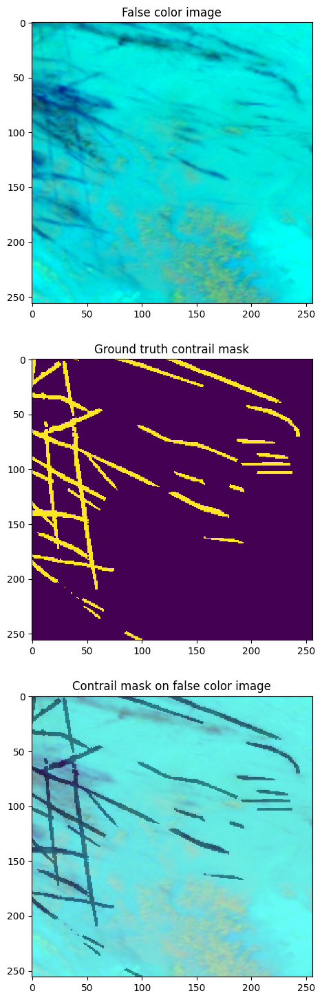

In [6]:
img = false_color[..., N_TIMES_BEFORE]

plt.figure(figsize=(6, 18))
ax = plt.subplot(3, 1, 1)
ax.imshow(img)
ax.set_title("False color image")

ax = plt.subplot(3, 1, 2)
ax.imshow(record_data["human_pixel_masks"], interpolation="none")
ax.set_title("Ground truth contrail mask")

ax = plt.subplot(3, 1, 3)
ax.imshow(img)
ax.imshow(record_data["human_pixel_masks"], cmap="Reds", alpha=.4, interpolation="none")
ax.set_title("Contrail mask on false color image");

<p style="font-family: consolas; font-size: 16px;">⚪ Ground truth was determined by (generally) 4+ different labelers annotating each image. So we can easily plot these masks.</p>

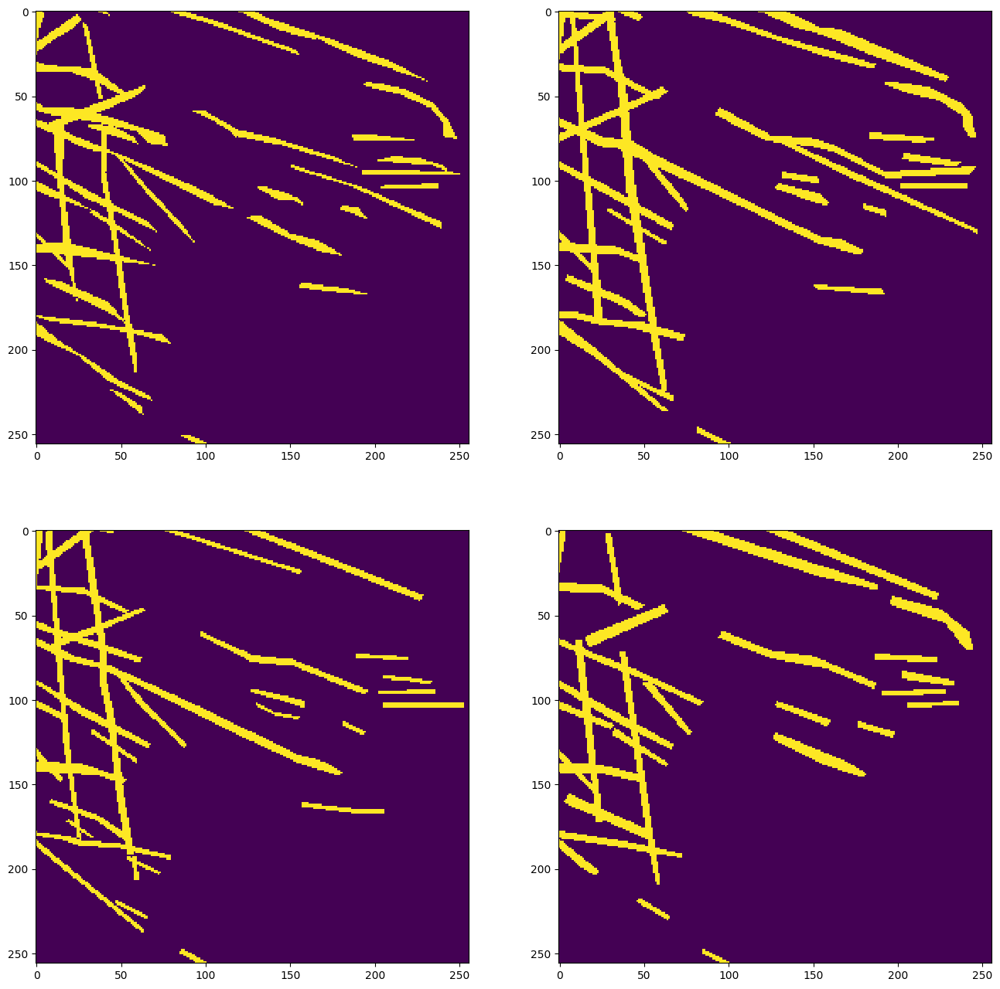

In [7]:
# Individual human masks
count = record_data["human_individual_masks"].shape[-1]

m = math.ceil(record_data["human_individual_masks"].shape[-1] / 2)
n = 2
plt.figure(figsize=(n*8, m*8))
for i in range(count):
    plt.subplot(m, n, i+1)
    plt.imshow(record_data["human_individual_masks"][..., i], interpolation="none")

<p style="font-family: consolas; font-size: 16px;">⚪ Now let's see the record data in action.</p>

In [8]:
# Animation
fig = plt.figure(figsize=(6, 6))
im = plt.imshow(false_color[..., 0])

anim = animation.FuncAnimation(
    fig, draw, frames=false_color.shape[-1], interval=500, blit=True
)
plt.close()
display.HTML(anim.to_jshtml())

<a id="2.2"></a>
## <div style="box-shadow: rgba(0, 0, 0, 0.18) 0px 2px 4px inset; padding:20px; font-size:24px; font-family: consolas; text-align:center; display:fill; border-radius:15px; color:rgb(67, 66, 66)"> <b> 2.2 Record <code>1002294268041839364</code></b></div>

<p style="font-family: consolas; font-size: 16px;">⚪ Let's consider record 1002294268041839364. First need to load it.</p>

In [9]:
N_TIMES_BEFORE = 4
record_id = "1002294268041839364"

record_data = read_record(record_id, CFG.train_path)

<p style="font-family: consolas; font-size: 16px;">⚪ Next step is combining bands into a false color image.</p>

In [10]:
false_color = get_false_color(record_data)

<p style="font-family: consolas; font-size: 16px;">⚪ Let's plot false color image with ground truth contrail mask. As mentioned earlier pixels are considering as a contrail when >50% of the labelers annotated it as such.</p>

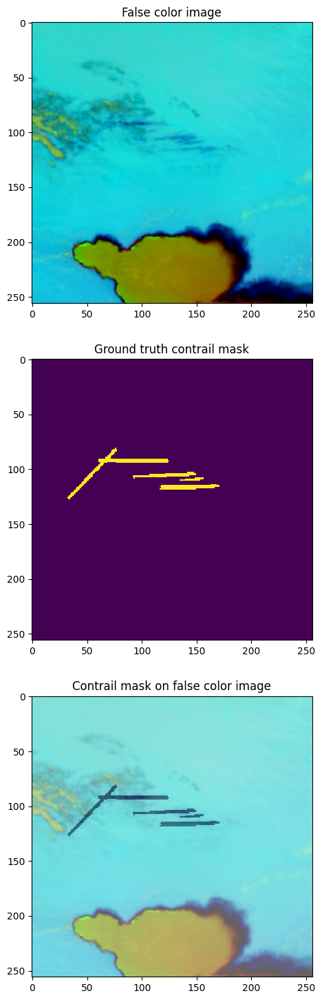

In [11]:
img = false_color[..., N_TIMES_BEFORE]

plt.figure(figsize=(6, 18))
ax = plt.subplot(3, 1, 1)
ax.imshow(img)
ax.set_title("False color image")

ax = plt.subplot(3, 1, 2)
ax.imshow(record_data["human_pixel_masks"], interpolation="none")
ax.set_title("Ground truth contrail mask")

ax = plt.subplot(3, 1, 3)
ax.imshow(img)
ax.imshow(record_data["human_pixel_masks"], cmap="Reds", alpha=.4, interpolation="none")
ax.set_title("Contrail mask on false color image");

<p style="font-family: consolas; font-size: 16px;">⚪ Ground truth was determined by (generally) 4+ different labelers annotating each image. So we can easily plot these masks.</p>

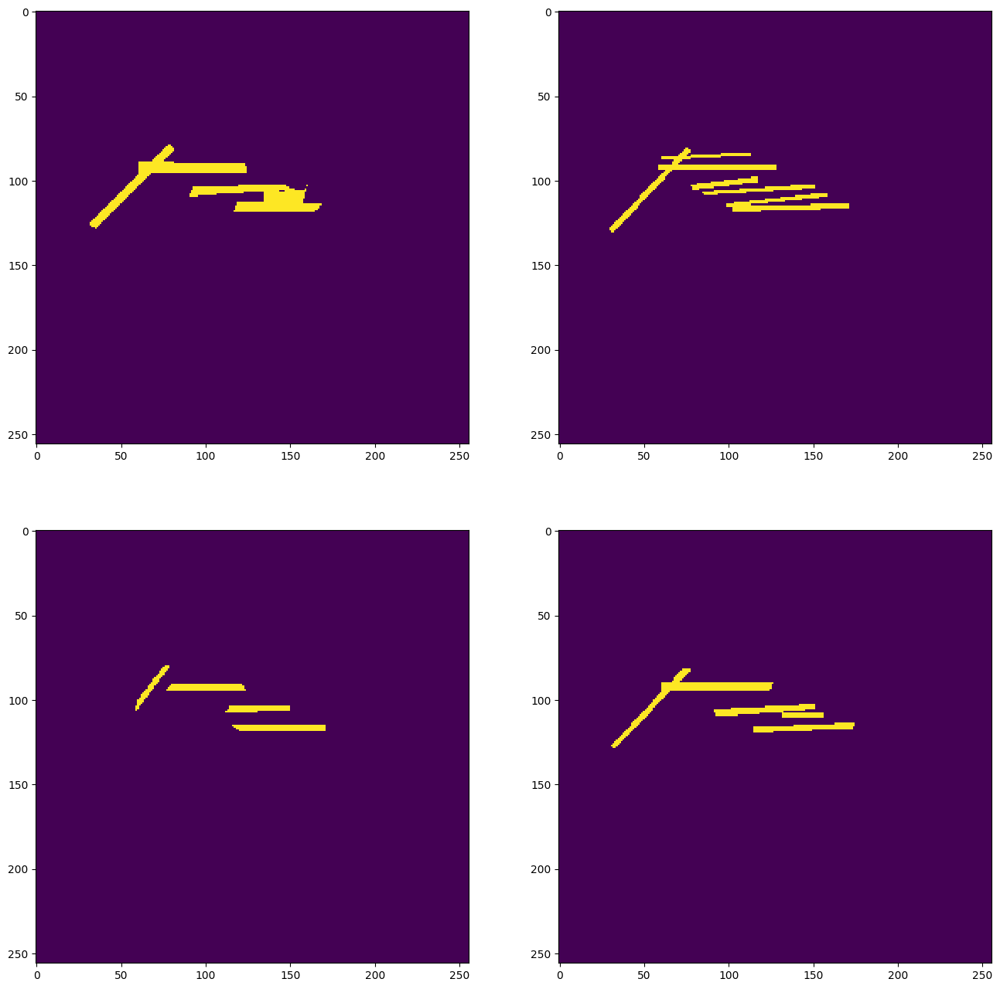

In [12]:
# Individual human masks
count = record_data["human_individual_masks"].shape[-1]

m = math.ceil(record_data["human_individual_masks"].shape[-1] / 2)
n = 2
plt.figure(figsize=(n*8, m*8))
for i in range(count):
    plt.subplot(m, n, i+1)
    plt.imshow(record_data["human_individual_masks"][..., i], interpolation="none")

<p style="font-family: consolas; font-size: 16px;">⚪ Now let's see the record data in action.</p>

In [13]:
# Animation
fig = plt.figure(figsize=(6, 6))
im = plt.imshow(false_color[..., 0])

anim = animation.FuncAnimation(
    fig, draw, frames=false_color.shape[-1], interval=500, blit=True
)
plt.close()
display.HTML(anim.to_jshtml())

<a id="3"></a>
# <div style="box-shadow: rgba(0, 0, 0, 0.16) 0px 1px 4px inset, rgb(51, 51, 51) 0px 0px 0px 3px inset; padding:20px; font-size:32px; font-family: consolas; text-align:center; display:fill; border-radius:15px;  color:rgb(34, 34, 34);"> <b> 3. <code>validation/</code> directory</b></div>

<p style="font-family: consolas; font-size: 16px;">🔴 This is the same as the training set, without the individual label annotations; it is permitted to use this as training data if desired</p>

<a id="3.1"></a>
## <div style="box-shadow: rgba(0, 0, 0, 0.18) 0px 2px 4px inset; padding:20px; font-size:24px; font-family: consolas; text-align:center; display:fill; border-radius:15px; color:rgb(67, 66, 66)"> <b> 3.1 Record <code>1049287742871594610</code></b></div>

<p style="font-family: consolas; font-size: 16px;">⚪ Let's consider record 1000834164244036115. First need to load it.</p>

In [14]:
N_TIMES_BEFORE = 4
record_id = "1049287742871594610"

record_data = read_record(record_id, CFG.validation_path)

<p style="font-family: consolas; font-size: 16px;">⚪ Next step is combining bands into a false color image.</p>

In [15]:
false_color = get_false_color(record_data)

<p style="font-family: consolas; font-size: 16px;">⚪ Let's plot false color image with ground truth contrail mask. As mentioned earlier pixels are considering as a contrail when >50% of the labelers annotated it as such.</p>

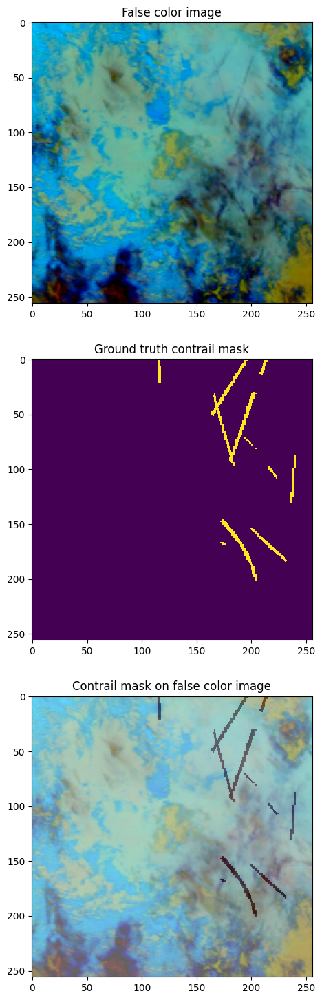

In [16]:
img = false_color[..., N_TIMES_BEFORE]

plt.figure(figsize=(6, 18))
ax = plt.subplot(3, 1, 1)
ax.imshow(img)
ax.set_title("False color image")

ax = plt.subplot(3, 1, 2)
ax.imshow(record_data["human_pixel_masks"], interpolation="none")
ax.set_title("Ground truth contrail mask")

ax = plt.subplot(3, 1, 3)
ax.imshow(img)
ax.imshow(record_data["human_pixel_masks"], cmap="Reds", alpha=.4, interpolation="none")
ax.set_title("Contrail mask on false color image");

<p style="font-family: consolas; font-size: 16px;">⚪ Now let's see the record data in action.</p>

In [17]:
# Animation
fig = plt.figure(figsize=(6, 6))
im = plt.imshow(false_color[..., 0])

anim = animation.FuncAnimation(
    fig, draw, frames=false_color.shape[-1], interval=500, blit=True
)
plt.close()
display.HTML(anim.to_jshtml())

<a id="4"></a>
# <div style="box-shadow: rgba(0, 0, 0, 0.16) 0px 1px 4px inset, rgb(51, 51, 51) 0px 0px 0px 3px inset; padding:20px; font-size:32px; font-family: consolas; text-align:center; display:fill; border-radius:15px;  color:rgb(34, 34, 34);"> <b> 4. <code>test/</code> directory</b></div>

<p style="font-family: consolas; font-size: 16px;">🔴 This is the test set; our objective is to identify contrails found in these records. <b>Note</b>: Since this is a Code competition, you do not have access to the actual test set that your notebook is rerun against. The records shown here are copies of the first two records of the validation data (without the labels). The hidden test set is approximately the same size (± 5%) as the validation set. <b>IMPORTANT</b>: Submissions should use <code>run-length encoding</code> with empty predictions (e.g., no contrails) should be marked by <code>'-'</code> in the submission. (See this <a href="https://www.kaggle.com/code/inversion/contrails-rle-submission"><strong>notebook</strong></a> for details.)</p>

In [18]:
!ls $CFG.test_path

1000834164244036115  1002653297254493116


In [19]:
!stat $CFG.test_path

  File: /kaggle/input/google-research-identify-contrails-reduce-global-warming/test
  Size: 0         	Blocks: 0          IO Block: 16384  directory
Device: 38h/56d	Inode: 13495997832  Links: 4
Access: (0755/drwxr-xr-x)  Uid: (65534/  nobody)   Gid: (65534/ nogroup)
Access: 2023-05-10 15:52:39.588300226 +0000
Modify: 2023-05-10 15:52:39.616655371 +0000
Change: 2023-05-10 15:52:39.616655371 +0000
 Birth: -


In [20]:
# (⁠ ⁠ꈍ⁠ᴗ⁠ꈍ⁠) WORK STILL IN PROGRESS

# <div style="box-shadow: rgba(240, 46, 170, 0.4) -5px 5px inset, rgba(240, 46, 170, 0.3) -10px 10px inset, rgba(240, 46, 170, 0.2) -15px 15px inset, rgba(240, 46, 170, 0.1) -20px 20px inset, rgba(240, 46, 170, 0.05) -25px 25px inset; padding:20px; font-size:30px; font-family: consolas; display:fill; border-radius:15px; color: rgba(240, 46, 170, 0.7)"> <b> ༼⁠ ⁠つ⁠ ⁠◕⁠‿⁠◕⁠ ⁠༽⁠つ Thank You!</b></div>

<p style="font-family:verdana; color:rgb(34, 34, 34); font-family: consolas; font-size: 16px;"> 💌 Thank you for taking the time to read through my notebook. I hope you found it interesting and informative. If you have any feedback or suggestions for improvement, please don't hesitate to let me know in the comments. <br><br> 🚀 If you liked this notebook, please consider upvoting it so that others can discover it too. Your support means a lot to me, and it helps to motivate me to create more content in the future. <br><br> ❤️ Once again, thank you for your support, and I hope to see you again soon!</p>